In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<h1
  style="
    border: 2px solid aqua;
    border-radius: 8px;
    padding: 8px;
    text-align: center;
  "
>
  Machine Learning 1 Workshop: Blood vessel segmentation
</h1>

**By:**
- Djezza Moncef
- Sadoudi Abdessamad
  
**Under the supervision of:**
- Dr. Belal Khaldi

**Getting Started**

In [ ]:
# input_path = './data/'
input_path = '/content/drive/MyDrive/study/random/ml1 tp03/Data/'

# output_path = './output/'
output_path = '/content/drive/MyDrive/study/random/ml1 tp03/working/'

Loading the train dataset

In [ ]:
import os

train_photo_paths = [input_path + 'train/image/' + x for x in os.listdir(input_path + '/train/image/')]
train_label_paths = [input_path + 'train/mask/' + x for x in os.listdir(input_path + '/train/mask/')]

# assuring the same order
train_photo_paths.sort()
train_label_paths.sort()

In [ ]:
import cv2

train_raw_photos = [cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)  for path in train_photo_paths]
train_masks = [cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2GRAY) for path in train_label_paths]
train_masks = [np.where(mask > 0, 255, 0) for mask in train_masks]

In [ ]:
import matplotlib.pyplot as plt

#imagesSet structure is [row1, row2,..., rown] where rowi is [image1, image2,..., imagen]
def plot_images(imagesSet, title, figsize=(20, 10), cmap=None):
    plt.figure(figsize=figsize)
    plt.suptitle(title, fontsize=20)
    for i in range(len(imagesSet[0])):
        for j in range(len(imagesSet)):
            plt.subplot(len(imagesSet), len(imagesSet[0]), i + j*len(imagesSet[0]) + 1)
            plt.imshow(imagesSet[j][i], cmap=cmap)
            plt.axis('off')
        plt.tight_layout()

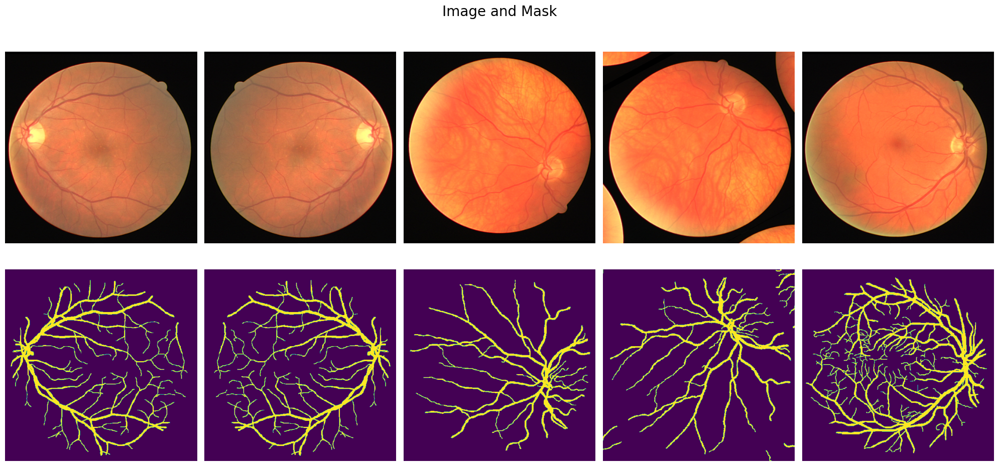

In [ ]:
plot_images([train_raw_photos[:5], train_masks[:5]], 'Image and Mask')

**Prepocessing**

1. Color Channels

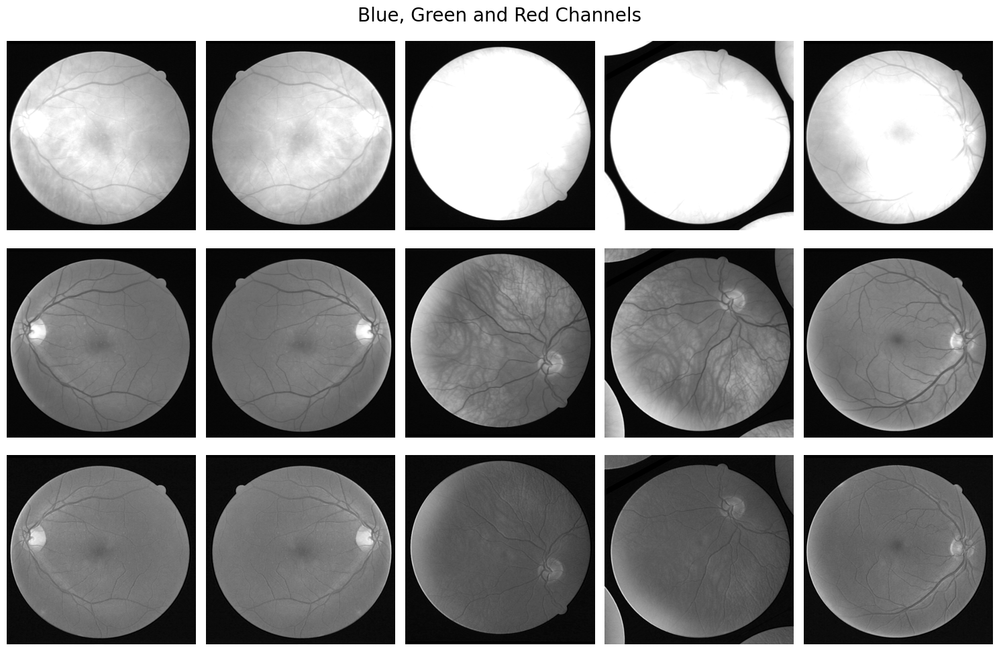

In [ ]:
train_photos_blue = [photo[:, :, 0] for photo in train_raw_photos]
train_photos_green = [photo[:, :, 1] for photo in train_raw_photos]
train_photos_red = [photo[:, :, 2] for photo in train_raw_photos]

plot_images([train_photos_blue[:5], train_photos_green[:5], train_photos_red[:5]], 'Blue, Green and Red Channels', figsize=(15,10), cmap='gray')

- We can see that the green color channel is the best one that shows the blood vessels.

2. Contrast Enhancement¶

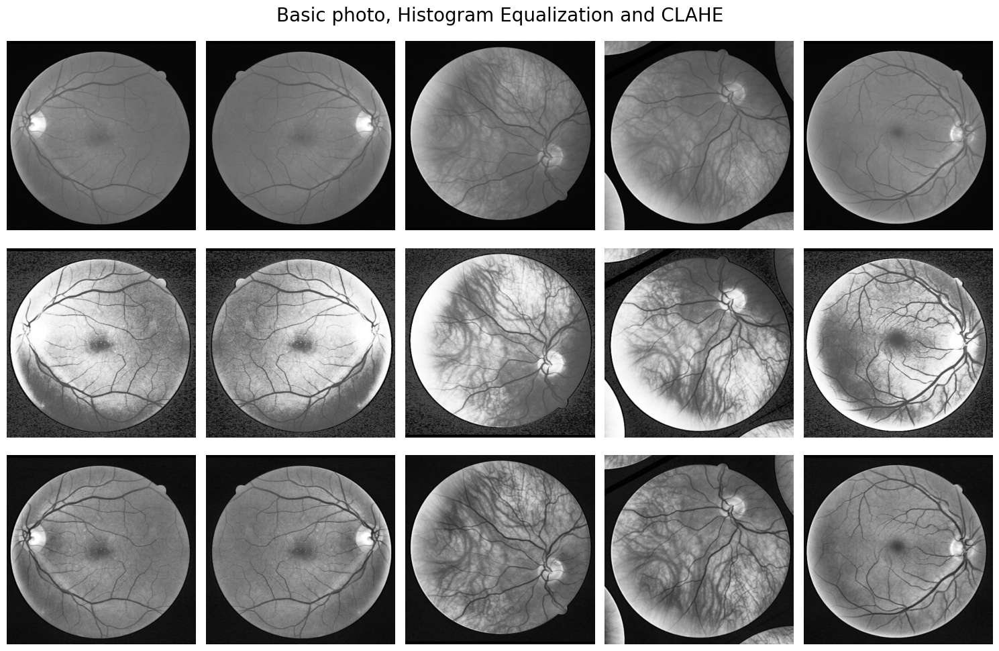

In [ ]:
#HE
train_photos_eq_sample = [cv2.equalizeHist(photo) for photo in train_photos_green[:5]]

#CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
train_photos_clahe_sample = [clahe.apply(photo) for photo in train_photos_green[:5]]

plot_images([train_photos_green[:5], train_photos_eq_sample, train_photos_clahe_sample], 'Basic photo, Histogram Equalization and CLAHE', figsize=(15,10), cmap='gray')

- The histogram equalization and CLAHE significantly caused the vessels to appear clearer. However, CLAHE seems to work better.

In [ ]:
train_photos_clahe =  [clahe.apply(photo) for photo in train_photos_green]

In [ ]:
train_photos = train_photos_clahe

**Quality of the results**

Loading the test dataset

In [ ]:
test_photo_paths = [input_path + 'test/image/' + x for x in os.listdir(input_path + '/test/image/')]
test_label_paths = [input_path + 'test/mask/' + x for x in os.listdir(input_path + '/test/mask/')]

test_photo_paths.sort()
test_label_paths.sort()

In [ ]:
test_raw_photos = [cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB) for path in test_photo_paths]
test_masks = [cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2GRAY) for path in test_label_paths]
test_masks = np.array(test_masks).astype(np.uint8)
test_masks = [np.where(mask > 0, 255, 0) for mask in test_masks]

In [ ]:
test_photos_green = [photo[:, :, 1] for photo in test_raw_photos]
test_photos = [clahe.apply(photo) for photo in test_photos_green]
test_masks_sharr = [cv2.magnitude(cv2.Scharr(photo, cv2.CV_64F, 1, 0), cv2.Scharr(photo, cv2.CV_64F, 0, 1)) for photo in test_photos]

Quality measures

In [ ]:
from sklearn.metrics import accuracy_score, f1_score

def get_quality(masks, postprocessed_masks):
    accuracy_scores = [accuracy_score(mask.flatten(), postprocessed_mask.flatten()) for mask, postprocessed_mask in zip(masks, postprocessed_masks)]
    f1_scores = [f1_score(mask.flatten(), postprocessed_mask.flatten(), average='macro') for mask, postprocessed_mask in zip(masks, postprocessed_masks)]
    return accuracy_scores, f1_scores

def plot_results(imagesSet, title, figsize=(27, 10), n=10):
    accuracy_scores, f1_scores = get_quality(imagesSet[1], imagesSet[2])

    if n > len(imagesSet[0]):
        n = len(imagesSet[0])

    plt.figure(figsize=figsize)
    plt.suptitle(title, fontsize=20)
    for i in range(n):
        plt.subplot(3, 10, i + 1)
        plt.imshow(test_raw_photos[i], cmap='gray')
        plt.axis('off')
        plt.title('Photo')
        plt.subplot(3, 10, i + 11)
        plt.imshow(test_masks[i], cmap='gray')
        plt.axis('off')
        plt.title('Ground truth')
        plt.subplot(3, 10, i + 21)
        plt.imshow(imagesSet[2][i], cmap='gray')
        plt.axis('off')
        plt.title('Mask\nAcc: {:.3f}\nF1: {:.3f}'.format(accuracy_scores[i], f1_scores[i]))
        plt.tight_layout()
    plt.show()
    print('Global avg accuracy: {:.3f}'.format(np.mean(accuracy_scores)))
    print('Global avg F1 score: {:.3f}'.format(np.mean(f1_scores)))

In [ ]:
from skimage.measure import moments_central, moments_hu, moments_normalized
from skimage.util import view_as_windows

def features_extracting(photo_batch):
    color_variance = np.var(photo_batch, axis=(1, 2))
    hu_moments = np.zeros((len(photo_batch), 7))
    for i, photo in enumerate(photo_batch):
        mu = moments_central(photo, order=5)
        nu = moments_normalized(mu)
        hu = moments_hu(nu)
        hu_moments[i] = hu

    features = np.concatenate((color_variance.reshape(-1, 1), hu_moments), axis=1)
    return features


def create_dataset(photos, masks, size=5, step=1):
    ds_photos = []
    ds_masks = []
    for photo, mask in zip(photos, masks):
        photo_pad = np.pad(
            photo, ((size // 2, size // 2), (size // 2, size // 2)), mode="constant"
        )
        mask_pad = np.pad(
            mask, ((size // 2, size // 2), (size // 2, size // 2)), mode="constant"
        )

        # Extract patches
        patches_photo = view_as_windows(photo_pad, (size, size), step=step).reshape(
            -1, size, size
        )
        patches_mask = view_as_windows(mask_pad, (size, size), step=step).reshape(
            -1, size, size
        )

        # Extract features for all patches in a batch
        batched_features = features_extracting(patches_photo)

        ds_photos.extend(batched_features)
        ds_masks.extend(
            patches_mask[:, size // 2, size // 2]
        )  # Extract central pixel from each mask patch

    return ds_photos, ds_masks


def undersampling(photos, masks):
    photos_0 = []
    photos_225 = []
    for i in range(len(masks)):
        if masks[i] == 0:
            photos_0.append(photos[i])
        else:
            photos_225.append(photos[i])

    print(len(photos_0), len(photos_225))
    np.random.shuffle(photos_0)
    photos_0 = photos_0[: len(photos_225)]
    photos = photos_0 + photos_225
    masks = [0] * len(photos_0) + [225] * len(photos_225)
    return photos, masks

In [ ]:
train_features, train_pred = create_dataset(train_photos, train_masks, size=5, step=5)

In [ ]:
train_features_under, train_pred_under = undersampling(train_features, train_pred)

745256 103464


In [ ]:
train_pred_under.count(0), train_pred_under.count(225)

(103464, 103464)

**Logistic Regression Model**

In [ ]:
from sklearn.linear_model import LogisticRegression
import joblib
import multiprocessing as mp

def predict_image(args):
    photo, mask, logistic_reg, create_dataset, threshold = args
    test_features, test_pred = create_dataset([photo], [mask], size=5)
    y_pred = logistic_reg.predict_proba(test_features)[:, 1]  # Get the probability of the positive class
    y_pred_img = (y_pred > threshold).astype(int).reshape(512, 512)  # Apply the threshold and convert to binary
    return y_pred_img

logistic_reg = LogisticRegression(class_weight='balanced') # Black and White should have the same importance
logistic_reg.fit(train_features_under, train_pred_under)

joblib.dump(logistic_reg, open(output_path + 'logistic_regression_model.pth', 'wb'))

threshold = 0.6
pool = mp.Pool(processes=mp.cpu_count())
args = [(photo, mask, logistic_reg, create_dataset, threshold) for photo, mask in zip(test_photos, test_masks)]
y_pred_images_lr = pool.map(predict_image, args)
pool.close()
pool.join()

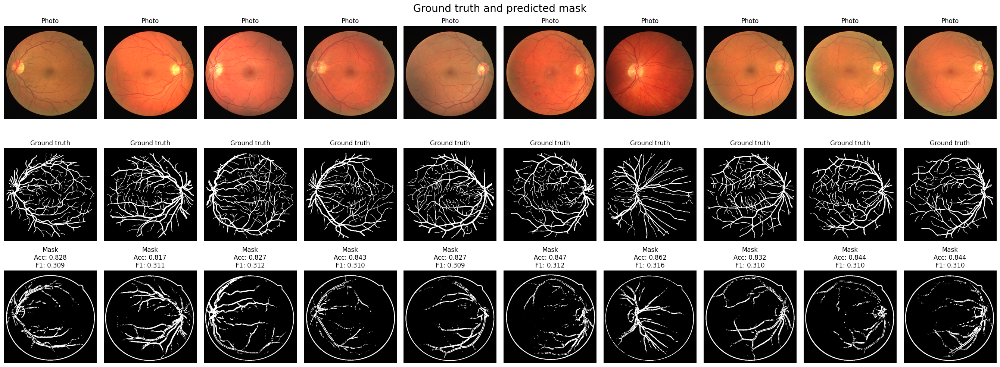

Global avg accuracy: 0.840
Global avg F1 score: 0.311


In [ ]:
plot_results([test_photos, test_masks, y_pred_images_lr], 'Ground truth and predicted mask')

- We can see that there is a circle that significantly affects the model's accuracy. Therefore, we are going to eliminate it.

In [ ]:
from PIL import Image, ImageDraw

def crop_circle(img_arr, radius, center_x, center_y):
    """
    Crops a circular region with a specified radius and center coordinates from the input image array.

    Args:
        img_arr (numpy.ndarray): Input image array.
        radius (int or float): Radius of the circle to be cropped.
        center_x (int or float): X-coordinate of the center of the circle.
        center_y (int or float): Y-coordinate of the center of the circle.

    Returns:
        numpy.ndarray: Cropped image array with a circular region.
    """
    height, width = img_arr.shape[:2]

    # Create a blank image with the same size as the input image
    lum_img = Image.new('L', [height, width], 0)

    # Draw a white circle on the blank image with the specified radius and center coordinates
    draw = ImageDraw.Draw(lum_img)
    draw.pieslice([(center_x - radius, center_y - radius),
                   (center_x + radius, center_y + radius)],
                  0, 360, fill=255, outline="white")

    # Convert the drawn circle to a numpy array
    lum_img_arr = np.array(lum_img)

    # Stack the input image array and the circle mask array
    final_img_arr = np.dstack((img_arr, lum_img_arr))

    # Apply the circle mask to the input image array
    cropped_img_arr = np.zeros_like(img_arr)
    cropped_img_arr[final_img_arr[:, :, -1] > 0] = img_arr[final_img_arr[:, :, -1] > 0]

    return cropped_img_arr

In [ ]:
desired_radius = 229  # Adjust this value to change the radius of the circle
center_x = 256  # Adjust this value to change the x-coordinate of the center
center_y = 261  # Adjust this value to change the y-coordinate of the center

y_pred_images_lr_cropped = [crop_circle(img_arr, desired_radius, center_x, center_y) for img_arr in y_pred_images_lr]

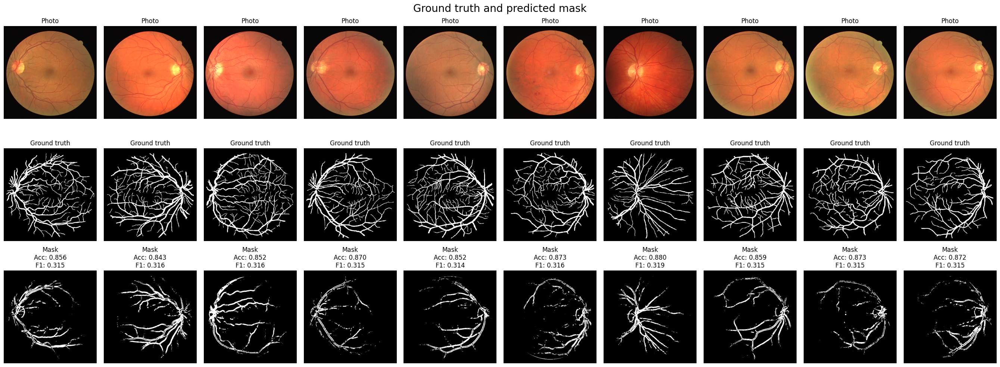

Global avg accuracy: 0.865
Global avg F1 score: 0.315


In [ ]:
plot_results([test_photos, test_masks, y_pred_images_lr_cropped], 'Ground truth and predicted mask')

**GLM model based gaussian distribution**

In [ ]:
from sklearn.linear_model import TweedieRegressor
import numpy as np

def predict_image(args):
    photo, mask, glm_model, create_dataset = args
    test_features, test_pred = create_dataset([photo], [mask], size=5)
    y_pred = glm_model.predict(test_features)
    y_pred_img = y_pred.reshape(512, 512)  # Reshape the predicted values to the image size
    return y_pred_img

glm_model = TweedieRegressor(power=0, link='identity')
train_pred_under_array = np.array(train_pred_under)
glm_model.fit(train_features_under, train_pred_under_array.ravel())

joblib.dump(glm_model, open(output_path + 'glm_gaussian_model.pth', 'wb'))

pool = mp.Pool(processes=mp.cpu_count())
args = [(photo, mask, glm_model, create_dataset) for photo, mask in zip(test_photos, test_masks)]
y_pred_images_glm = pool.map(predict_image, args)
pool.close()
pool.join()

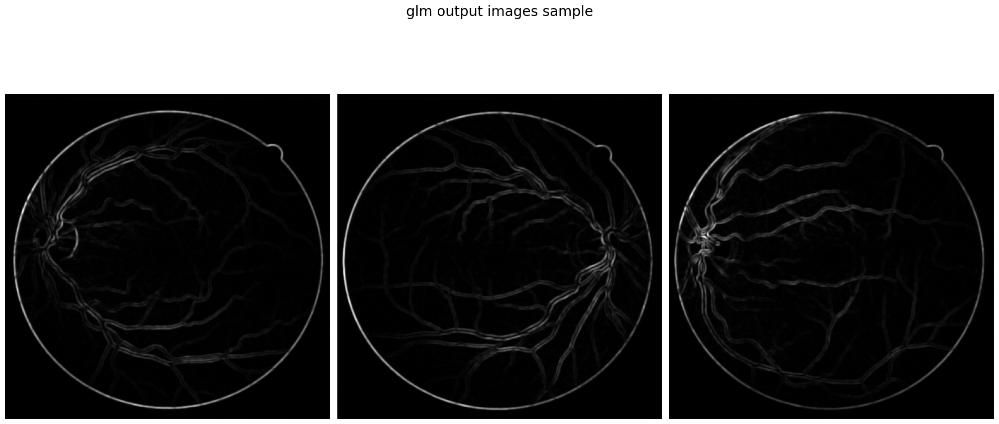

In [ ]:
plot_images([[y_pred_images_glm[0], y_pred_images_glm[1], y_pred_images_glm[2]]], 'glm output images sample', cmap='gray')

- The model is functioning, but the output lacks contrast.

In [ ]:
# Enhance contrast and binarize the output
y_pred_images_glm_binary = ((np.array(y_pred_images_glm) - np.min(y_pred_images_glm, axis=(1, 2), keepdims=True)) /
                           (np.max(y_pred_images_glm, axis=(1, 2), keepdims=True) -
                            np.min(y_pred_images_glm, axis=(1, 2), keepdims=True))) > 0.05
y_pred_images_glm_binary = y_pred_images_glm_binary.astype(int)

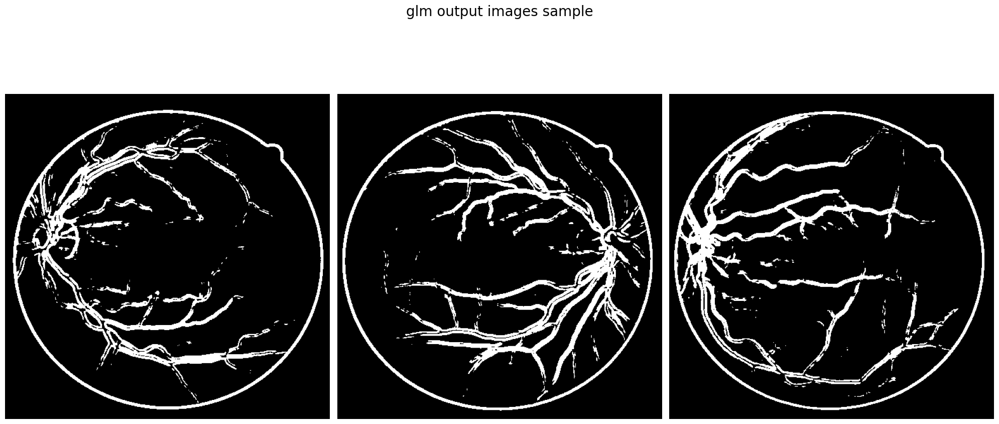

In [ ]:
plot_images([[y_pred_images_glm_binary[0], y_pred_images_glm_binary[1], y_pred_images_glm_binary[2]]], 'glm output images sample', cmap='gray')

In [ ]:
# Crop the outer circle
y_pred_images_glm_binary_cropped = [crop_circle(img_arr, desired_radius, center_x, center_y) for img_arr in y_pred_images_glm_binary]

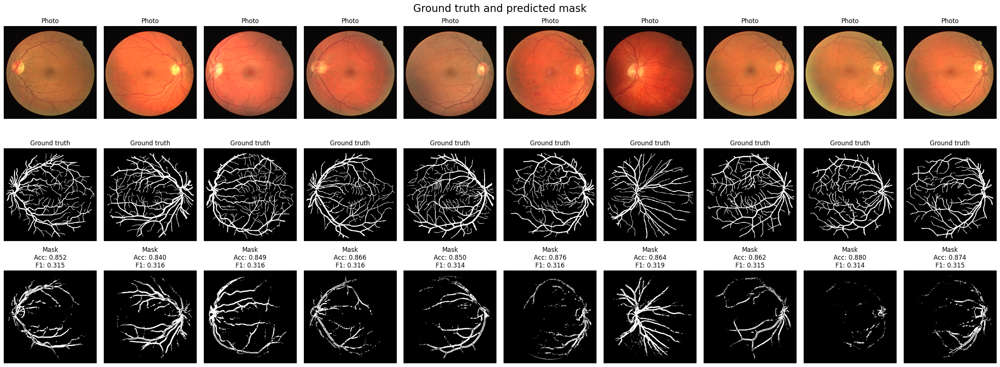

Global avg accuracy: 0.864
Global avg F1 score: 0.315


In [ ]:
plot_results([test_photos, test_masks, y_pred_images_glm_binary_cropped], 'Ground truth and predicted mask')

**Comparative Analysis**
1. Logistic Regression Model:
  1. Strengths:
    - Logistic regression is a well-established and interpretable machine learning algorithm that is suitable for binary classification tasks like image segmentation.
    - The model takes into account class imbalance by using the 'class_weight="balanced"' parameter, which can help improve performance on imbalanced datasets.
    - The model provides probabilities for each pixel, which can be thresholded to obtain the final binary segmentation. The threshold can be adjusted based on the desired output.

  1. Weaknesses:
    - Logistic regression is a linear model, which may not be able to capture complex non-linear relationships in the data as effectively as more flexible models like neural networks.
    - The global average accuracy (0.865) and F1-score (0.315) suggest that the model may not be performing as well as desired, potentially due to the complexity of the segmentation task.
    - The use of a fixed threshold (0.6) for binarizing the probabilistic output may not be optimal.

1. Generalized Linear Model (GLM):
  1. Strengths:
    - GLMs, such as the Tweedie Regressor used here, are a flexible class of models that can handle a variety of data distributions, including continuous, discrete, and mixed data types.
    - The GLM model may be able to capture non-linear relationships in the data better than the logistic regression model, as it does not have the same linearity constraint.
    - The global average accuracy (0.864) and F1-score (0.315) are comparable to the logistic regression model, suggesting that the GLM model is also a viable option for this binary image segmentation task.

  1. Weaknesses:
    - The GLM model may be more computationally expensive than the logistic regression model, especially when working with large-scale datasets or high-resolution images.
    - The performance of the GLM model may be more sensitive to the choice of the power parameter, which determines the distribution family, and the link function, which determines the relationship between the predictor and the response.

1. Overall the two models produce relatively comparable segmentation results, with a slight differences in the details of the segmented regions.
